# 0. Setup

Import packages and specify any important functions here.

In [8]:
# import standard python packages
import pandas as pd
import subprocess
import os
import dill
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context

sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

# add the utils and env directories to the path
import sys
sys.path.append('../../utils/')
sys.path.append('../../env/')

# import functions from utils directory files
from string_functions import *
from biofile_handling import *
from scanpy_wrappers import *

# import paths to software installs from env
from install_locs import *

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.9.1 pandas==1.4.4 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.7


# 1. Load BioFileDocket

Load in the BioFileDocket file for this dataset using `BioFileDocket.unpickle()`

In [9]:
################
# general info #
################

# Specify the name of the species folder in Amazon S3
species = 'Xenopus_laevis'

# Specify any particular identifying conditions, eg tissue type:
conditions = 'adultbrain'

################

species_prefix = prefixify(species)

# Specify folder as destination for file downloads
output_folder = '../../output/' + prefixify(species) + '_' + conditions + '/'

if not os.path.exists(output_folder):
    os.mkdir(output_folder)
    
species_SampleDict = SampleDict(species, conditions, output_folder)
species_BioFileDocket = BioFileDocket(species_SampleDict).get_from_s3().unpickle()
species_BioFileDocket.s3_to_local()

file Xlae_adultbrain_sample_BioFileDocket.pkl already exists at ../../output/Xlae_adultbrain/Xlae_adultbrain_sample_BioFileDocket.pkl
file XENLA_9.2_Xenbase.gtf already exists at ../../output/Xlae_adultbrain/XENLA_9.2_Xenbase.gtf
file XENLA_9.2_GCA.gff already exists at ../../output/Xlae_adultbrain/XENLA_9.2_GCA.gff
file XENLA_9.2_genome.fa already exists at ../../output/Xlae_adultbrain/XENLA_9.2_genome.fa
file GSM6214268_Xenopus_brain_COL65_dge.txt already exists at ../../output/Xlae_adultbrain/GSM6214268_Xenopus_brain_COL65_dge.txt
file Xlae_adultbrain_uniprot-idmm.tsv already exists at ../../output/Xlae_adultbrain/Xlae_adultbrain_uniprot-idmm.tsv
file Xlae_adultbrain_gtf-idmm.tsv already exists at ../../output/Xlae_adultbrain/Xlae_adultbrain_gtf-idmm.tsv
file XENLA_9.2_genome_cDNA.fa already exists at ../../output/Xlae_adultbrain/XENLA_9.2_genome_cDNA.fa
file XENLA_9.2_genome_cDNA.fa.transdecoder.bed already exists at ../../output/Xlae_adultbrain/XENLA_9.2_genome_cDNA.fa.transdecode

# 2. Load Gxc/Exc matrices

Load in and inspect the genes by cells and embedding by cells matrices.

In [10]:
#gxc = pd.read_csv(species_BioFileDocket.gxc.path, sep = '\t')
#display(gxc)
#exc = pd.read_csv(species_BioFileDocket.Orthogroup_exc.path, sep = '\t')
#display(exc)

# 3A. Load gxc matrix into scanpy

In [11]:
scanpy_data = ScanpyMetaObject(
    matrix = species_BioFileDocket.gxc,
    sampledict = species_SampleDict
    )
scanpy_data.read()

... reading from cache file cache/..-..-output-Xlae_adultbrain-GSM6214268_Xenopus_brain_COL65_dge.h5ad


# 4A. Run basic filtering and regressions on gxc data
Each function call collapses several scanpy native functions into a single function.  
See the `utils/scanpy_wrapper.py` document for more details about the specific subfunctions.

normalizing counts per cell


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:197: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


    finished (0:00:17)


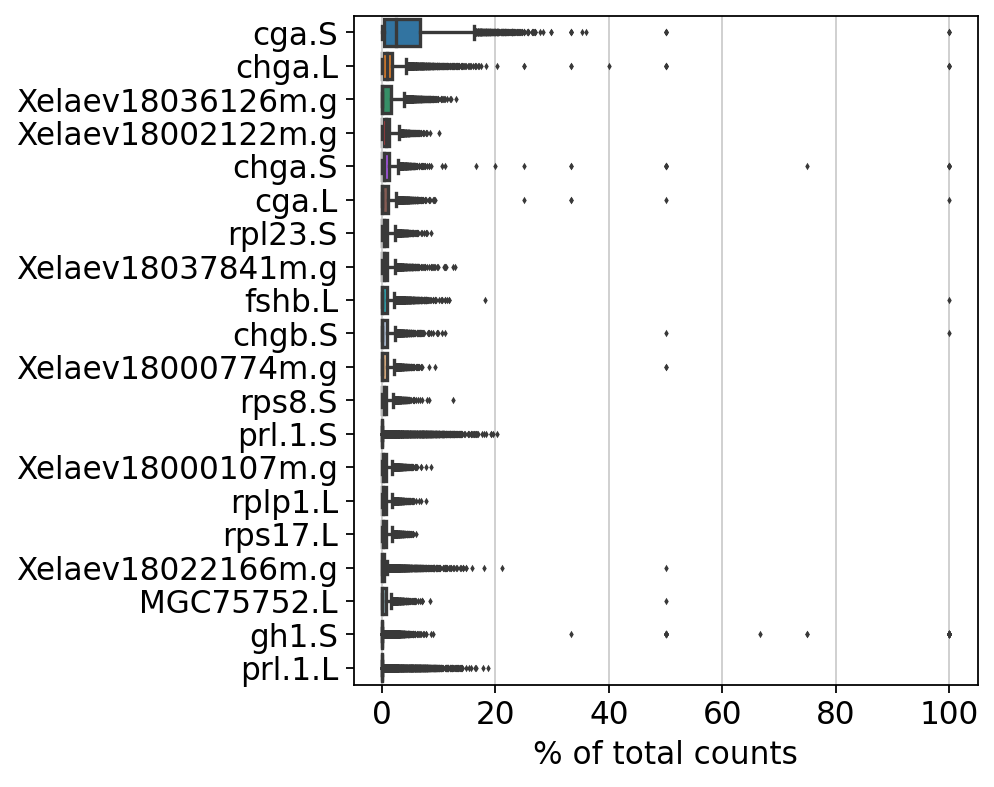

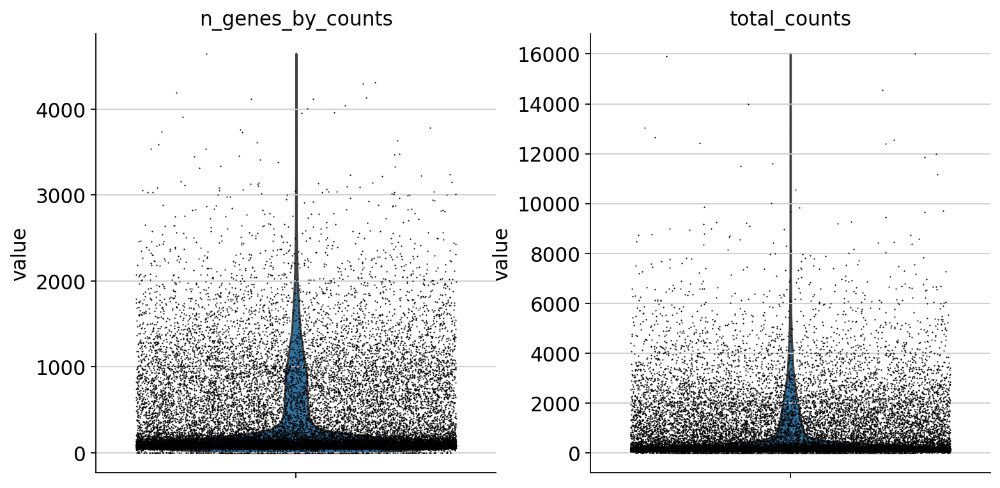

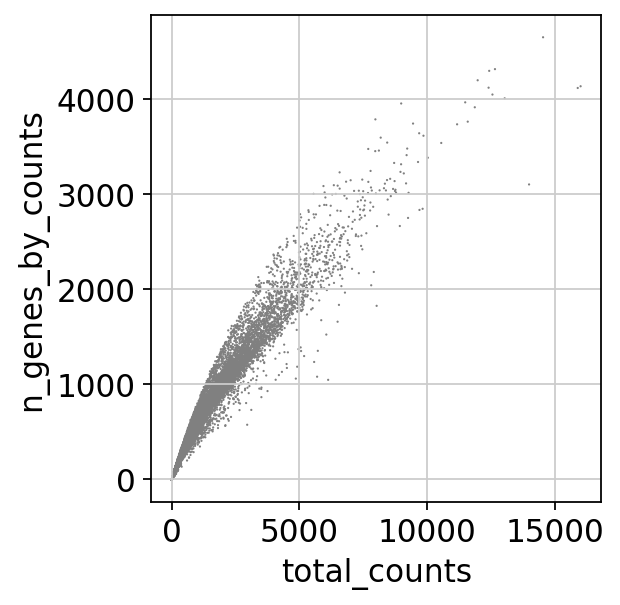

filtered out 12800 cells that have less than 100 genes expressed
filtered out 7127 genes that are detected in less than 20 cells


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


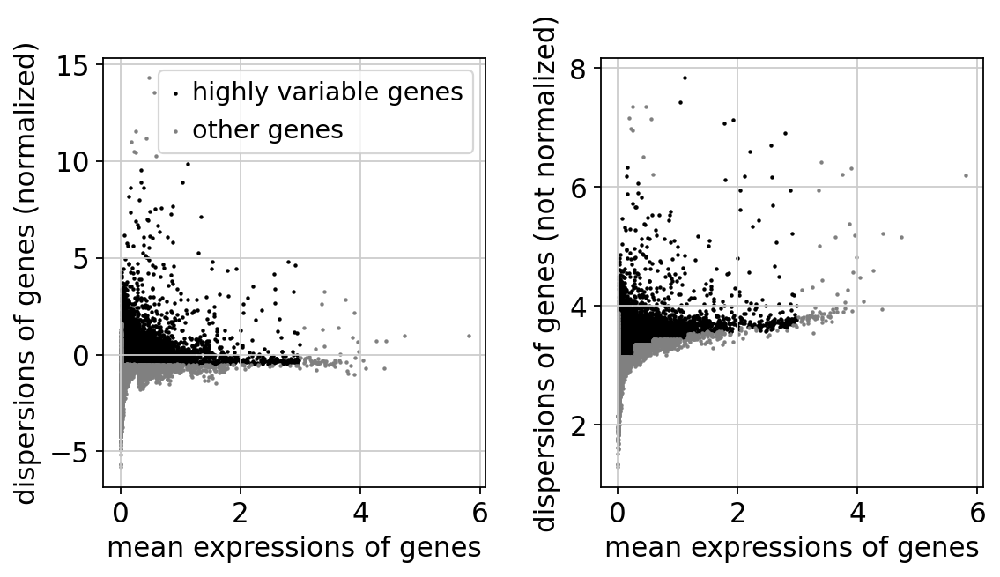

regressing out ['total_counts']
    finished (0:03:38)


In [12]:
sc.pl.highest_expr_genes(scanpy_data.adata, n_top=20, )
scanpy_data.violin()
scanpy_data.cellgene_filter(min_genes=100, min_cells=20)
scanpy_data.normalize(max_n_genes_by_counts = 7000, target_sum = 1e4)
scanpy_data.variable_filter(min_mean = 0.0125, max_mean = 3, min_disp = -0.5, max_disp = 10)
scanpy_data.regress_scale(how = ['total_counts'], max_value = 10)

# 5A. Run PCA and UMAP/Leiden on gxc data

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:11)


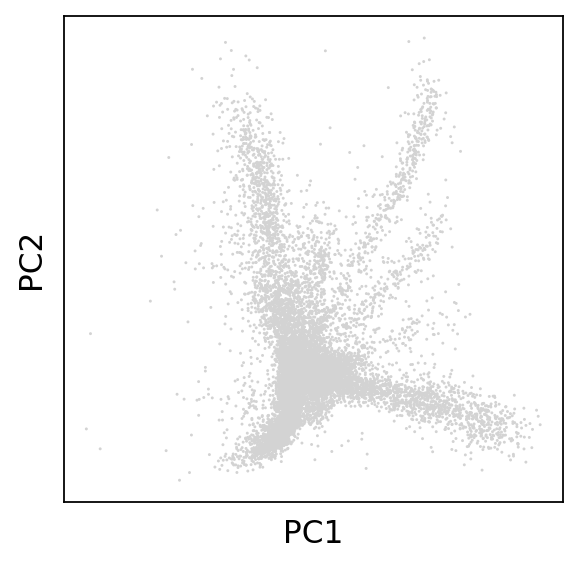

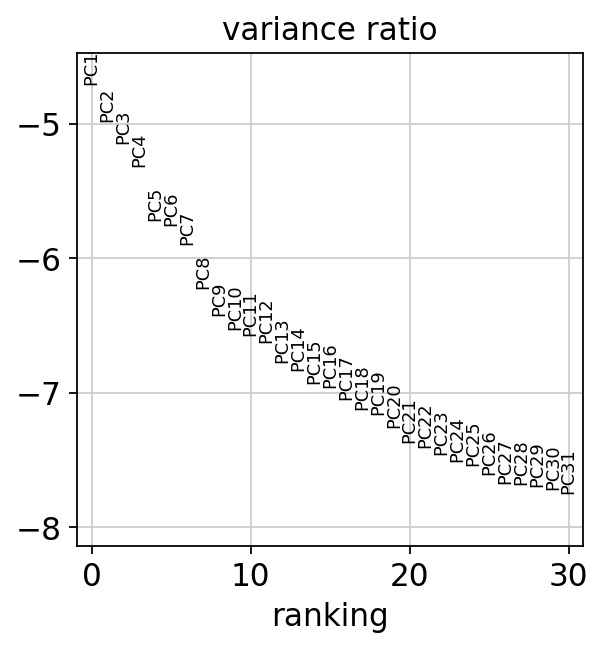

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:22)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:30)
running Leiden clustering
    finished: found 27 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:07)


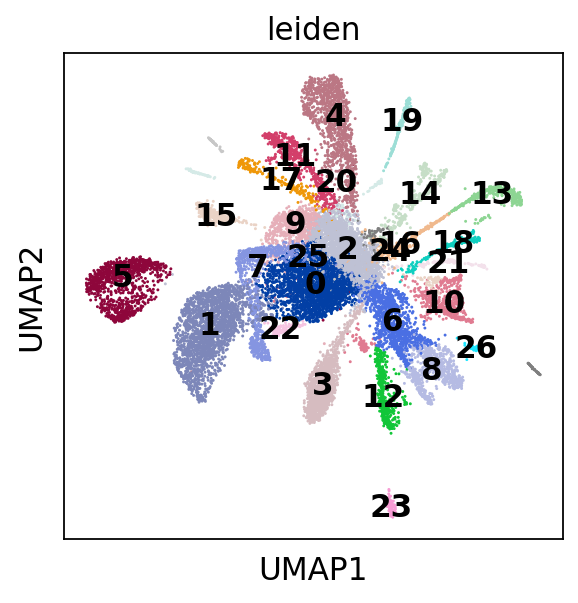

In [13]:
scanpy_data.pca_basic()
scanpy_data.umap_leiden()

# 6A. Plot expression of glial markers in gxc data

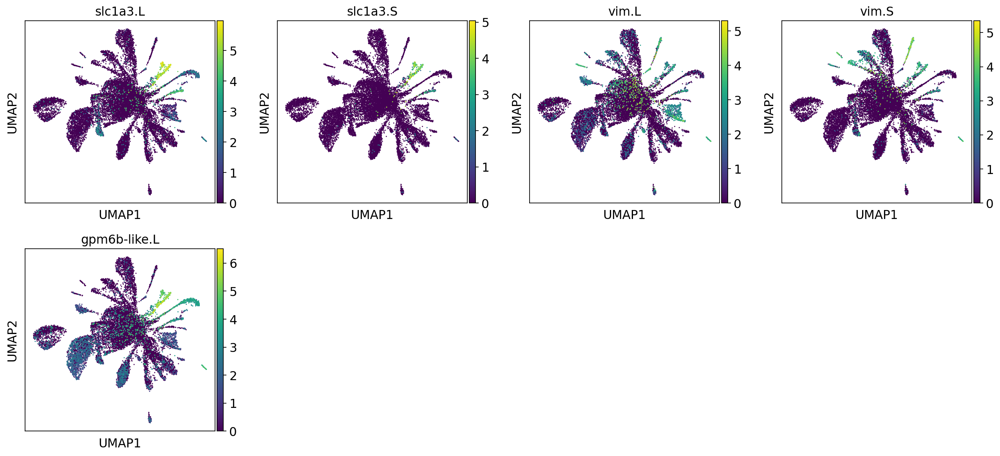

In [14]:
glial_markers = ['slc1a3.L', 'slc1a3.S', 'vim.L', 'vim.S', 'gpm6b-like.L']
sc.pl.umap(scanpy_data.adata, color=glial_markers)

# 7A. Get top marker genes and plot them

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:49)


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/tools/_ran

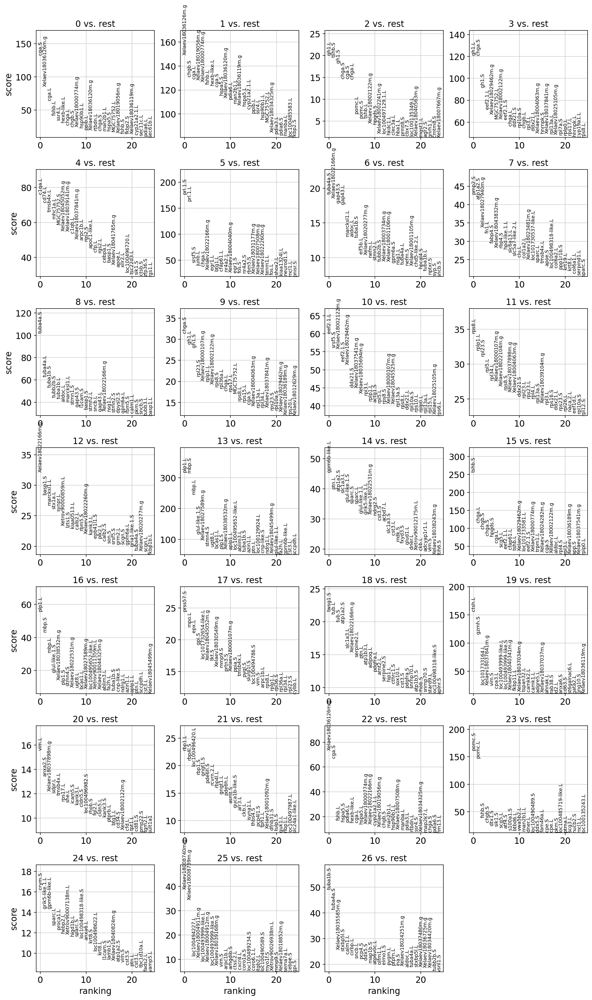

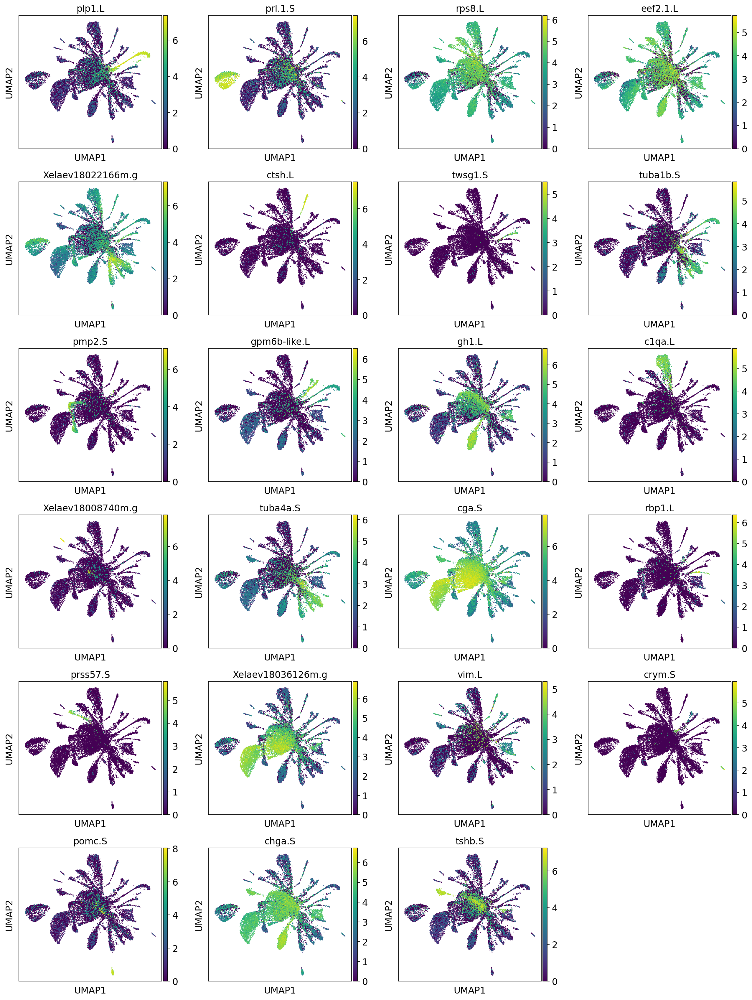

In [15]:
scanpy_data.rank_genes()
top_key, marker_key = scanpy_data.get_top_genes('gene-name')

# Running the line below exports top genes to file
#scanpy_data.export_top_genes(top_key)

sc.pl.umap(scanpy_data.adata, color=getattr(scanpy_data, marker_key))

# 8A. Cluster-specific genes

You can plot the `top_n` genes from a given `cluster_num` here for exploratory purposes.

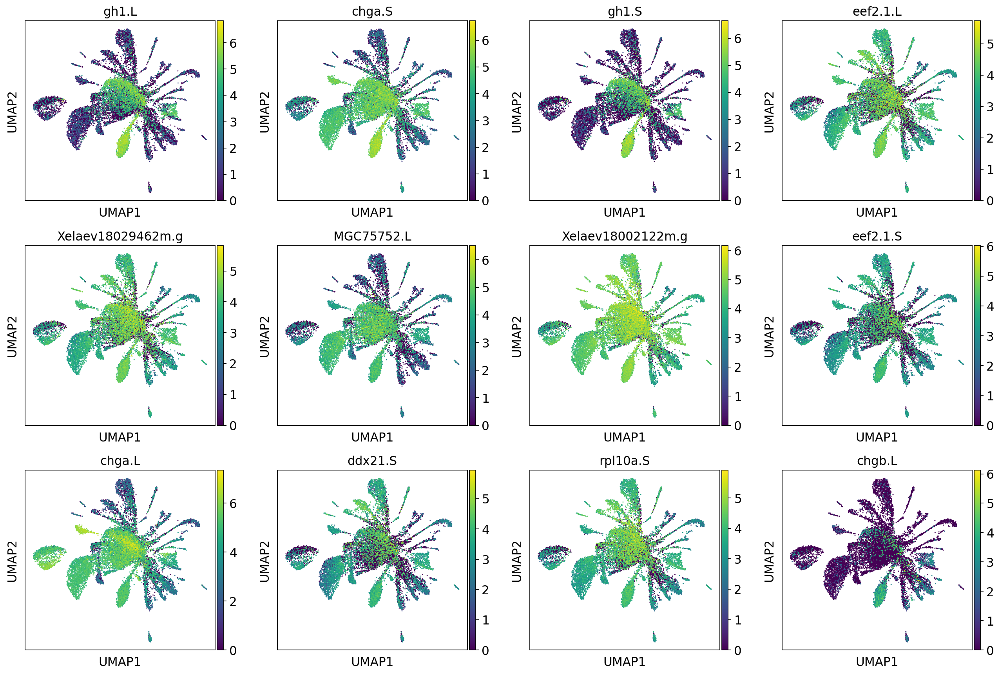

In [16]:
cluster_num = 3
top_n = 12
sc.pl.umap(scanpy_data.adata, color=scanpy_data.marker_genes_df[str(cluster_num)].tolist()[0:top_n])

# 3B. Load exc matrix into scanpy

In [17]:
orthogroup_data = ScanpyMetaObject(
    matrix = species_BioFileDocket.Orthogroup_exc,
    sampledict = species_SampleDict
    )
orthogroup_data.read()

... reading from cache file cache/..-..-output-Xlae_adultbrain-GSM6214268_Xenopus_brain_COL65_dge_asOrthogroup.h5ad


# 4B. Run basic filtering and regressions on gxc data
Each function call collapses several scanpy native functions into a single function.  
See the `utils/scanpy_wrapper.py` document for more details about the specific subfunctions.

normalizing counts per cell


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:197: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


    finished (0:00:07)


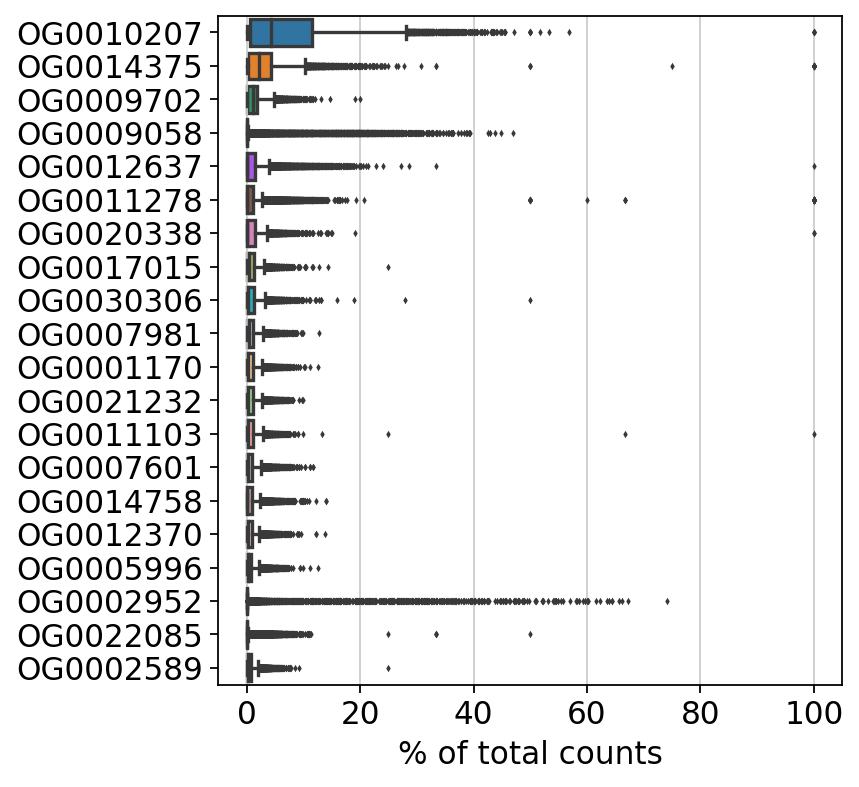

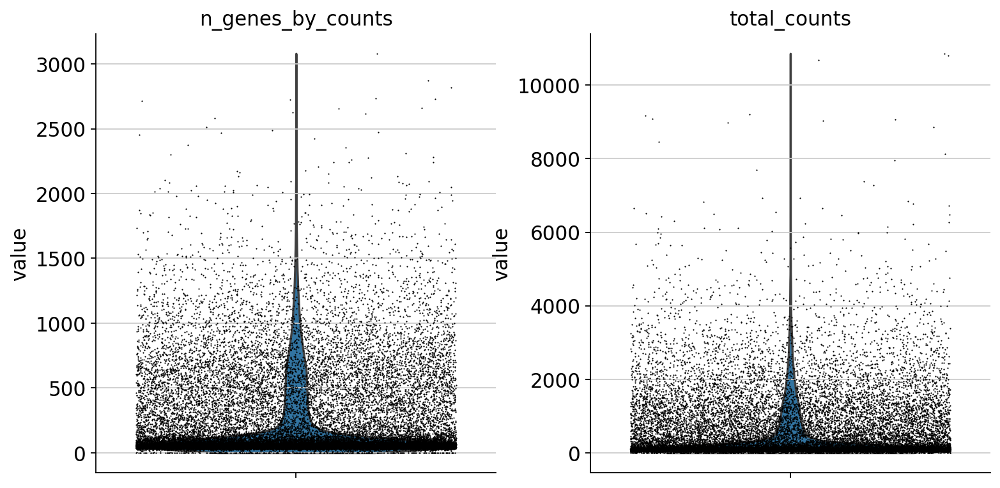

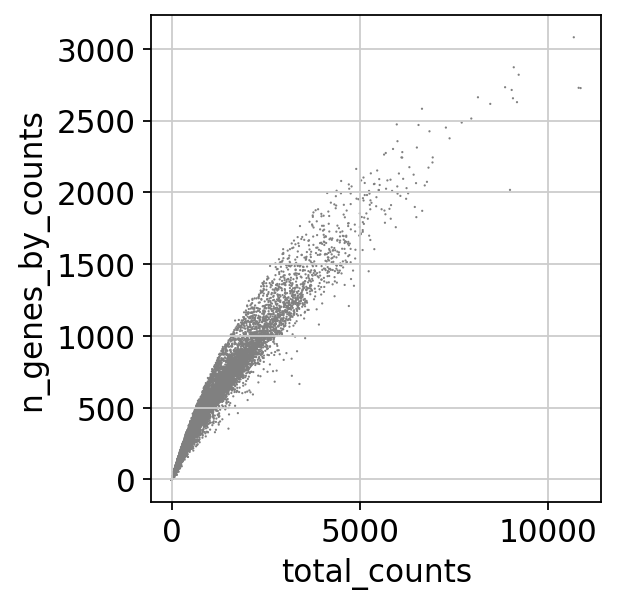

filtered out 18052 cells that have less than 100 genes expressed
filtered out 1701 genes that are detected in less than 20 cells


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


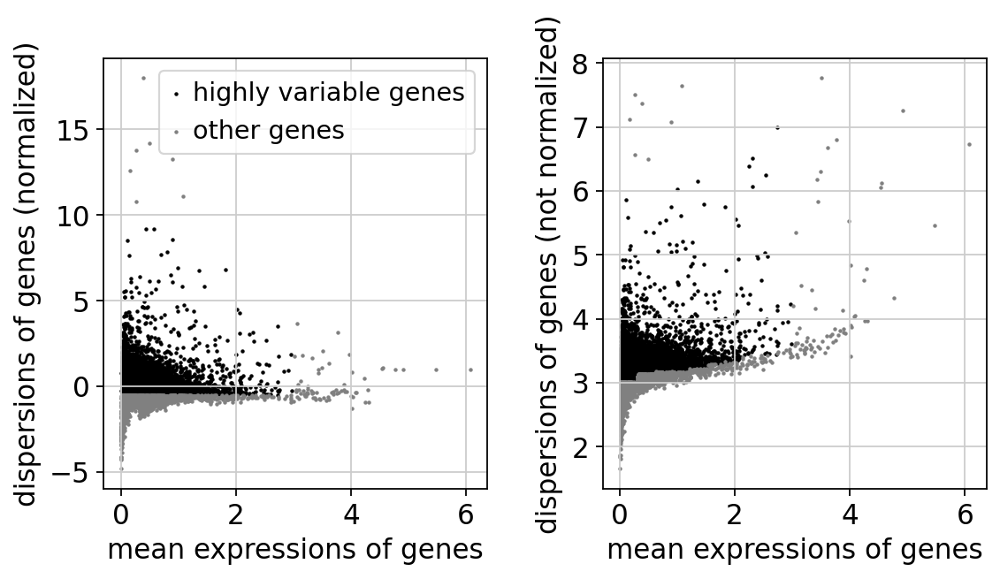

regressing out ['total_counts']
    finished (0:01:33)


In [18]:
sc.pl.highest_expr_genes(orthogroup_data.adata, n_top=20, )
orthogroup_data.violin()
orthogroup_data.cellgene_filter(min_genes=100, min_cells=20)
orthogroup_data.normalize(max_n_genes_by_counts = 7000, target_sum = 1e4)
orthogroup_data.variable_filter(min_mean = 0.0125, max_mean = 3, min_disp = -0.5, max_disp = 10)
orthogroup_data.regress_scale(how = ['total_counts'], max_value = 10)

# 5B. Run PCA and UMAP/Leiden on exc data

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


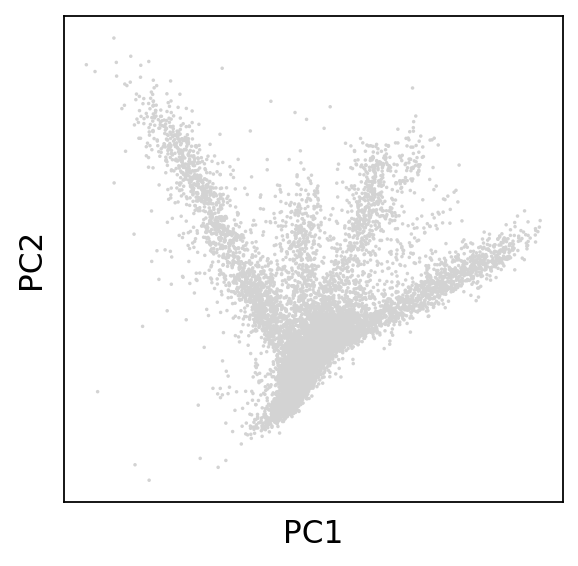

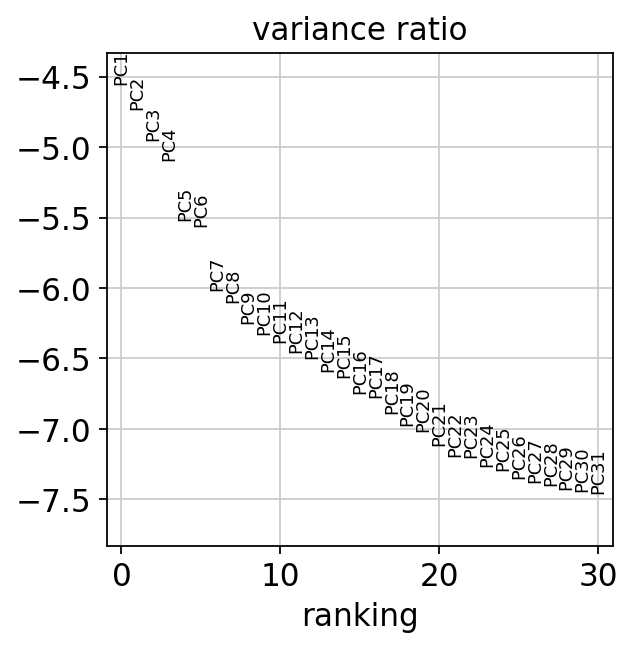

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:03)


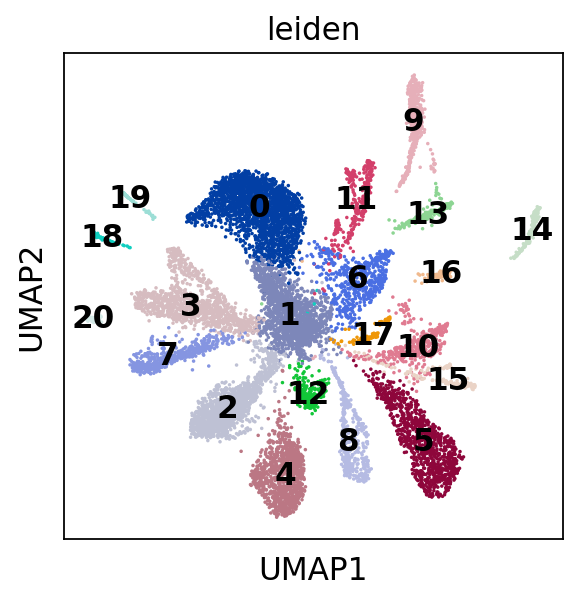

In [19]:
orthogroup_data.pca_basic()
orthogroup_data.umap_leiden()

# 6B. Map, then plot expression of glial markers in exc data

,gene_name,Orthogroup
7932,slc1a3.L,OG0003009
10605,slc1a3.S,OG0003009
30782,vim.L,OG0018047
32956,vim.S,OG0018047


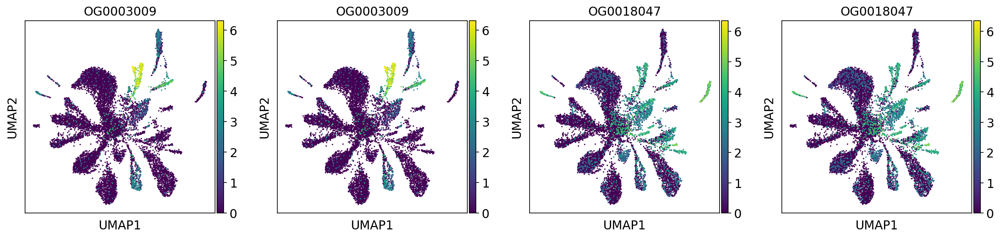

In [20]:
# Retrieve idmm object from BioFileDocket
idmm_object = species_BioFileDocket.og_idmm

# Map gene names to orthogroup IDs
glial_og = orthogroup_data.map_gene_to_id(idmm_object, glial_markers, 'gene_name', 'Orthogroup')

# Plot cells by orthogroups
sc.pl.umap(orthogroup_data.adata, color=glial_og)

# 7B. Get top marker orthogroups and plot them

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:14)


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/tools/_ran

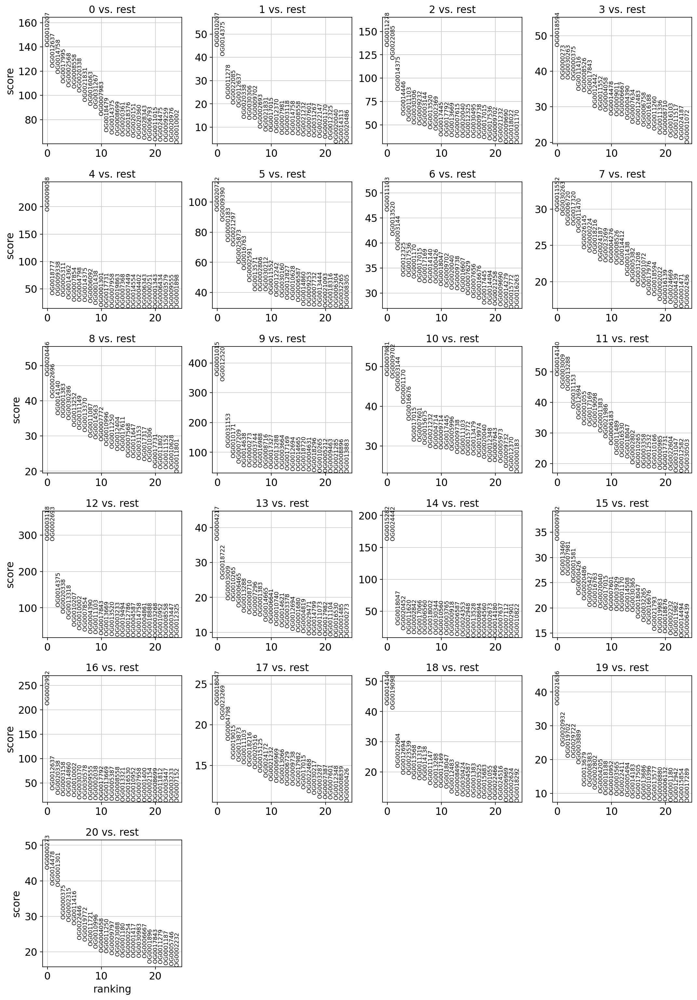

Wrote 2327 gene ids to ../../output/Xlae_adultbrain/Xlae_Exc_top_200DE_Orthogroup_ids.txt


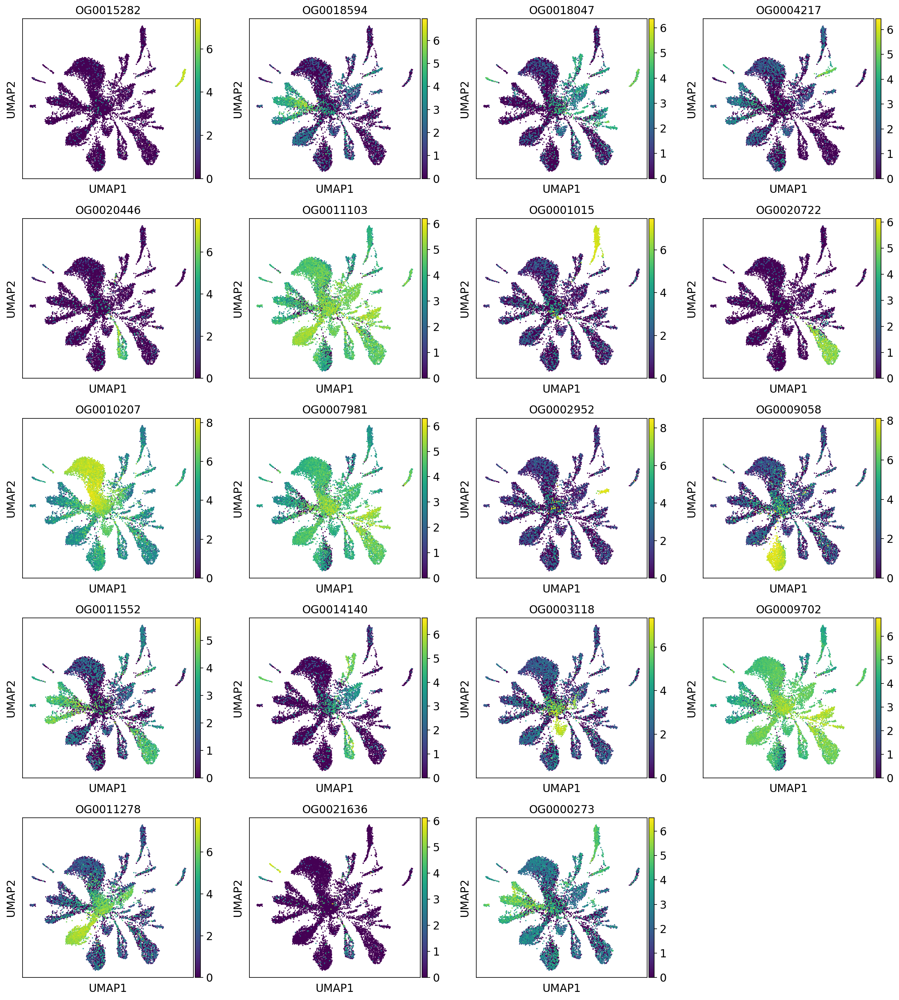

In [21]:
orthogroup_data.rank_genes()
top_orthogroup_key, marker_orthogroup_key = orthogroup_data.get_top_genes('Orthogroup')
orthogroup_data.export_top_genes(top_orthogroup_key)

sc.pl.umap(orthogroup_data.adata, color=getattr(orthogroup_data, marker_orthogroup_key))

In [23]:
top_orthogroup_filekey = top_orthogroup_key + '_file'

species_BioFileDocket.add_keyfile(getattr(orthogroup_data, top_orthogroup_filekey), 'topOrthogroups')
species_BioFileDocket.local_to_s3()
species_BioFileDocket.pickle()
species_BioFileDocket.push_to_s3(overwrite = False)

XENLA_9.2_Xenbase.gtf already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
XENLA_9.2_GCA.gff already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
XENLA_9.2_genome.fa already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
GSM6214268_Xenopus_brain_COL65_dge.txt already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
Xlae_adultbrain_uniprot-idmm.tsv already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
Xlae_adultbrain_gtf-idmm.tsv already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
XENLA_9.2_genome_cDNA.fa already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
XENLA_9.2_genome_cDNA.fa.transdecoder.bed already exists in S3 bucket, skipping upload. set overwrite = True to overwrite